In [1]:
import pandas as pd #for manipulating data
import numpy as np #for manipulating data
import sklearn #for building models
import xgboost as xgb #for building models
import sklearn.ensemble #for building models
from sklearn.model_selection import train_test_split #for creating a hold-out sample
import lime #LIME package
import lime.lime_tabular #the type of LIIME analysis we’ll do
import shap #SHAP package
import time #some of the routines take a while so we monitor the time
import os #needed to use Environment Variables in Domino
import matplotlib.pyplot as plt #for custom graphs at the end
import seaborn as sns #for custom graphs at the end
from datetime import datetime

c:\Users\Riccardo\anaconda3\envs\py39_ml\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data = pd.read_csv(r'../data/final_dataset_ndvi_spi.csv').drop(columns=['arc_xy'])

In [3]:
df = data.loc[(data.lon==33.5) & (data.lat==8)]

In [147]:
def check_length(df, dates):
    if len(dates) == len(pd.DataFrame(dates).merge(df[['time']], left_on=0, right_on='time')):
        print('Same length')
    else:
        print('Different length')

std_range = pd.date_range('2005-01-02','2010-01-03', freq='7D')
dates = pd.to_datetime(std_range, format='%Y-%m-%d')
dates =  [datetime.strftime(i.date(), format='%Y-%m-%d') for i in dates]

groups = data.groupby(['lat','lon'])
for name, group in groups:
    #check_length(group, dates)
    [t for t in dates if t not in group.time.tolist()]

In [110]:
df = data[(data.lon.between(30,40)) & (data.lat.between(6,16))]

In [112]:
X = df.drop(columns=['arc_xy','ndvi','time']).interpolate('linear')
y= df[['ndvi']].interpolate('linear').astype('float')

In [158]:
from sklearn.preprocessing import RobustScaler
from tqdm.auto import tqdm

scaler_dict = {}
scaler_dict_static = {}
scaler_dict_past = {}


def normalize(X_static, X_time, y_past=None, fit=False):
    for index in tqdm(range(X_time.shape[-1])):
        if fit:
            scaler_dict[index] = RobustScaler().fit(X_time[:, :, index].reshape(-1, 1))
        X_time[:, :, index] = (
            scaler_dict[index]
            .transform(X_time[:, :, index].reshape(-1, 1))
            .reshape(-1, X_time.shape[-2])
        )
    for index in tqdm(range(X_static.shape[-1])):
        if fit:
            scaler_dict_static[index] = RobustScaler().fit(
                X_static[:, index].reshape(-1, 1)
            )
        X_static[:, index] = (
            scaler_dict_static[index]
            .transform(X_static[:, index].reshape(-1, 1))
            .reshape(1, -1)
        )
    index = 0
    if y_past is not None:
        if fit:
            scaler_dict_past[index] = RobustScaler().fit(y_past.reshape(-1, 1))
        y_past[:, :] = (
            scaler_dict_past[index]
            .transform(y_past.reshape(-1, 1))
            .reshape(-1, y_past.shape[-1])
        )
        return X_static, X_time, y_past
    return X_static, X_time

import numpy as np
from scipy.interpolate import interp1d

def interpolate_nans(padata, pkind='linear'):
    """
    see: https://stackoverflow.com/a/53050216/2167159
    """
    aindexes = np.arange(padata.shape[0])
    agood_indexes, = np.where(np.isfinite(padata))
    f = interp1d(agood_indexes
               , padata[agood_indexes]
               , bounds_error=False
               , copy=False
               , fill_value="extrapolate"
               , kind=pkind)
    return f(aindexes)

In [155]:
data['fips'] = data[['lat','lon']].astype(str).apply(lambda x: ','.join(x), axis=1).astype('category').cat.codes

In [177]:
def date_encode(date):
    if isinstance(date, str):
        date = datetime.strptime(date, "%Y-%m-%d")
    return (
        np.sin(2 * np.pi * date.timetuple().tm_yday / 366),
        np.cos(2 * np.pi * date.timetuple().tm_yday / 366),
    )

def loadXY(
    df,
    random_state=42, # keep this at 42
    window_size=180, # how many days in the past (default/competition: 180)
    target_size=6, # how many weeks into the future (default/competition: 6)
    fuse_past=False, # add the past drought observations? (default: True)
    return_fips=False, # return the county identifier (do not use for predictions)
    encode_season=True, # encode the season using the function above (default: True) 
    use_prev_year=False, # add observations from 1 year prior?
):
    soil_df = df.reset_index()[['fips','lon', 'lat', 'elevation', 'land', 'slope1', 'slope2','slope3', 'slope4', 'slope5', 'slope6', 'slope7', 'slope8', 'WAT_LAND',
       'NVG_LAND', 'URB_LAND', 'GRS_LAND', 'FOR_LAND', 'CULTRF_LAND', 'CULTIR_LAND', 'CULT_LAND', 'SQ1', 'SQ2', 'SQ3', 'SQ4', 'SQ5', 'SQ6', 'SQ7']].drop_duplicates()
    time_data_cols = sorted(
        [c for c in df.columns if c not in ["fips", "time", "ndvi"]]
    )
    static_data_cols = sorted(
        [c for c in soil_df.columns if c not in ["lat", "lon"]]
    )
    count = 0
    score_df = df.dropna(subset=["ndvi"])
    X_static = np.empty((len(df) // window_size, len(static_data_cols))) ### 180 days prediction on every static column for each unique lat lon
    X_fips_date = []
    ##### add columns for time df if there's data from previous year, if drought lagged observations, if season is encoded in sin/cosin 
    add_dim = 0
    if use_prev_year:
        add_dim += len(time_data_cols)
    if fuse_past:
        add_dim += 1
        if use_prev_year:
            add_dim += 1
    if encode_season:
        add_dim += 2
    X_time = np.empty(
        (len(df) // window_size, window_size, len(time_data_cols) + add_dim)
    )
    ### array with last observations for y
    y_past = np.empty((len(df) // window_size, window_size))
    ### array for predicted future values
    y_target = np.empty((len(df) // window_size, target_size))
    ### set seed
    if random_state is not None:
        np.random.seed(random_state)

    ### loop over lat-lon combinations
    for fips in tqdm(score_df.index.get_level_values(0).unique()):
        if random_state is not None:
            start_i = np.random.randint(1, window_size)
        else:
            start_i = 1

        #### get time and static columns, outcome label
        fips_df = df[(df.index.get_level_values(0) == fips)]
        X = fips_df[time_data_cols].values
        y = fips_df["ndvi"].values
        X_s = soil_df[soil_df["fips"] == fips][static_data_cols].values[0]
        print('Time columns',fips_df[time_data_cols])
        print('Y columns',fips_df["ndvi"])
        print('Static columns',soil_df[soil_df["fips"] == fips][static_data_cols])


        for i in range(start_i, len(y) - (window_size + target_size * 7), window_size):
            X_fips_date.append((fips, fips_df.index[i : i + window_size][-1]))
            X_time[count, :, : len(time_data_cols)] = X[i : i + window_size]
            if use_prev_year:
                if i < 365 or len(X[i - 365 : i + window_size - 365]) < window_size:
                    continue
                X_time[count, :, -len(time_data_cols) :] = X[
                    i - 365 : i + window_size - 365
                ]
            if not fuse_past:
                y_past[count] = interpolate_nans(y[i : i + window_size])
            else:
                X_time[count, :, len(time_data_cols)] = interpolate_nans(
                    y[i : i + window_size]
                )
            if encode_season:
                enc_dates = [
                    date_encode(d) for f, d in fips_df.index[i : i + window_size].values
                ]
                d_sin, d_cos = [s for s, c in enc_dates], [c for s, c in enc_dates]
                X_time[count, :, len(time_data_cols) + (add_dim - 2)] = d_sin
                X_time[count, :, len(time_data_cols) + (add_dim - 2) + 1] = d_cos
            temp_y = y[i + window_size : i + window_size + target_size * 7]
            y_target[count] = np.array(temp_y[~np.isnan(temp_y)][:target_size])
            X_static[count] = X_s
            count += 1
    print(f"loaded {count} samples")
    results = [X_static[:count], X_time[:count], y_target[:count]]
    if not fuse_past:
        results.append(y_past[:count])
    if return_fips:
        results.append(X_fips_date)
    return results

In [178]:
results = loadXY(data.set_index(['fips', 'time']), return_fips=True)

  2%|▏         | 19/765 [00:00<00:03, 188.93it/s]

Time columns [[ 0.         13.07155991 13.07155991 ...  0.          0.
   0.43731786]
 [ 0.         13.07155991 13.07155991 ...  0.          0.
   0.5142624 ]
 [ 0.         13.07155991 13.07155991 ...  0.          0.
   0.36616281]
 ...
 [ 0.         13.07155991 13.07155991 ...  0.          0.
  -1.61409216]
 [ 0.         13.07155991 13.07155991 ...  0.          0.
  -1.73271659]
 [ 0.         13.07155991 13.07155991 ...  0.          0.
  -1.51067039]]
Y columns [0.155223   0.1353827  0.11484854 0.08791879 0.10515508 0.10485118
 0.10137274 0.08578684 0.08219874 0.07924894 0.04951925 0.05876718
 0.07443376 0.0798941  0.04225131 0.05145988 0.04406156 0.04522046
 0.04847925 0.05140863 0.05840516 0.05298944 0.10798356 0.07564317
 0.14521326 0.09922382 0.12064305 0.12133314 0.24505179 0.21738898
 0.23761851 0.26219749 0.29286994 0.26811181 0.291265   0.36235471
 0.24064195 0.23355335 0.32510444 0.33609319 0.39500257 0.1652783
 0.37016574 0.23787405 0.33876495 0.38731962 0.35885857 0.4132047

  7%|▋         | 57/765 [00:00<00:04, 160.62it/s]

Time columns [[ 0.          0.          0.         ...  0.0101      0.0064
   1.33666193]
 [ 0.          0.          0.         ...  0.0101      0.0064
   1.16189958]
 [ 0.          0.          0.         ...  0.0101      0.0064
   1.00767039]
 ...
 [ 0.          0.          0.         ...  0.0101      0.0064
  -0.44297867]
 [ 0.          0.          0.         ...  0.0101      0.0064
  -0.56467435]
 [ 0.          0.          0.         ...  0.0101      0.0064
  -0.23205546]]
Y columns [0.47717514 0.45217334 0.32483558 0.27045438 0.36484195 0.37756255
 0.31113752 0.35808024 0.34012318 0.38573645 0.20585427 0.13327945
 0.24589341 0.25069849 0.16763007 0.11953487 0.12374394 0.19571014
 0.1655992  0.18573131 0.11723373 0.20094012 0.22451043 0.11483617
 0.25850882 0.13705626 0.07924656 0.11393277 0.09615422 0.05711823
 0.07889046 0.09976592 0.16057059 0.08963599 0.17999622 0.09815291
 0.11497569 0.086243   0.08622049 0.07447226 0.08258523 0.09413959
 0.2246406  0.17489673 0.13391274 0.2540

 12%|█▏        | 93/765 [00:00<00:03, 170.74it/s]

Time columns [[ 0.00000000e+00  5.16676998e+00  5.16676998e+00 ...  4.00000000e-03
   0.00000000e+00 -7.21016526e-01]
 [ 0.00000000e+00  5.16676998e+00  5.16676998e+00 ...  4.00000000e-03
   0.00000000e+00 -7.13835648e-01]
 [ 0.00000000e+00  5.16676998e+00  5.16676998e+00 ...  4.00000000e-03
   0.00000000e+00 -7.18825161e-01]
 ...
 [ 0.00000000e+00  5.16676998e+00  5.16676998e+00 ...  4.00000000e-03
   0.00000000e+00 -9.65175714e-01]
 [ 0.00000000e+00  5.16676998e+00  5.16676998e+00 ...  4.00000000e-03
   0.00000000e+00 -6.52033606e-01]
 [ 0.00000000e+00  5.16676998e+00  5.16676998e+00 ...  4.00000000e-03
   0.00000000e+00  5.83861629e-02]]
Y columns [0.3615364  0.08525414 0.13115633 0.17397114 0.10358763 0.16851626
 0.30556727 0.26247409 0.16101795 0.11005792 0.27683192 0.10478833
 0.10762347 0.19762042 0.07158049 0.30703196 0.36326087 0.14733813
 0.12452786 0.19333701 0.26389158 0.16470695 0.28343989 0.18861598
 0.20611449 0.08903287 0.16431932 0.21827954 0.22997978 0.1117352
 0.0851

 19%|█▉        | 148/765 [00:00<00:03, 175.39it/s]

Time columns [[ 0.          0.          0.         ...  0.0071      0.002
   0.67521709]
 [ 0.          0.          0.         ...  0.0071      0.002
   0.61508952]
 [ 0.          0.          0.         ...  0.0071      0.002
   0.53118066]
 ...
 [ 0.          0.          0.         ...  0.0071      0.002
  -0.14645742]
 [ 0.          0.          0.         ...  0.0071      0.002
  -0.29489083]
 [ 0.          0.          0.         ...  0.0071      0.002
  -0.03896962]]
Y columns [ 0.08863091  0.06575667  0.04508826  0.0535006   0.03453378  0.06651054
  0.05988309  0.05311238  0.0559499   0.04281536  0.04298933  0.03409672
  0.04189143  0.05305508  0.0353561   0.03348839  0.02816031  0.03941079
  0.03329961  0.03630726  0.03830146  0.04391358  0.04604682  0.04573856
  0.04368686  0.03405561  0.03497851  0.04591431  0.04999282  0.04173645
  0.02951635  0.03760996  0.04000458  0.03988112  0.04683466  0.05187608
  0.03918693  0.03812513  0.05049499  0.0430955   0.04617606  0.05639524
  0.

 24%|██▍       | 185/765 [00:01<00:03, 179.30it/s]

Time columns [[0.         0.30808392 0.30808392 ... 0.2134     0.0983     0.01498432]
 [0.         0.30808392 0.30808392 ... 0.2134     0.0983     0.01769943]
 [0.         0.30808392 0.30808392 ... 0.2134     0.0983     0.03347953]
 ...
 [0.         0.30808392 0.30808392 ... 0.2134     0.0983     0.11784915]
 [0.         0.30808392 0.30808392 ... 0.2134     0.0983     0.07757101]
 [0.         0.30808392 0.30808392 ... 0.2134     0.0983     0.20266539]]
Y columns [0.31703036 0.21784376 0.11861776 0.12432345 0.09921953 0.21557846
 0.13134092 0.16800925 0.18354955 0.11593229 0.07783502 0.07104595
 0.26451256 0.35296267 0.22320685 0.18145074 0.30018945 0.25522876
 0.24807229 0.32787739 0.1947948  0.28974363 0.33977867 0.31488656
 0.27078199 0.16072851 0.15453221 0.15529124 0.12488899 0.12740156
 0.09668821 0.08760872 0.14269729 0.17146523 0.15491751 0.14191918
 0.10658705 0.09380182 0.09340287 0.11345756 0.15652899 0.10470483
 0.12120343 0.11841342 0.13689123 0.16070236 0.0749148  0.332687

 29%|██▉       | 224/765 [00:01<00:02, 185.51it/s]

Time columns [[ 0.00000000e+00  4.43795319e+01  4.43795319e+01 ...  1.05000000e-01
   4.20000000e-02 -2.76845023e-01]
 [ 0.00000000e+00  4.43795319e+01  4.43795319e+01 ...  1.05000000e-01
   4.20000000e-02 -1.14883712e-01]
 [ 0.00000000e+00  4.43795319e+01  4.43795319e+01 ...  1.05000000e-01
   4.20000000e-02  1.17902638e-01]
 ...
 [ 0.00000000e+00  4.43795319e+01  4.43795319e+01 ...  1.05000000e-01
   4.20000000e-02 -6.48734323e-01]
 [ 0.00000000e+00  4.43795319e+01  4.43795319e+01 ...  1.05000000e-01
   4.20000000e-02 -7.16709197e-01]
 [ 0.00000000e+00  4.43795319e+01  4.43795319e+01 ...  1.05000000e-01
   4.20000000e-02 -6.05222225e-01]]
Y columns [0.3180942  0.28728846 0.15544259 0.18246511 0.14292581 0.25055474
 0.23314956 0.22916996 0.18111485 0.13226728 0.13635517 0.16935528
 0.24590957 0.32047965 0.18878123 0.20376547 0.19761688 0.1192876
 0.20847515 0.2574976  0.17847912 0.23334572 0.35695938 0.29593041
 0.27154866 0.26851326 0.24543289 0.10698106 0.18017684 0.13742967
 0.1683

 32%|███▏      | 243/765 [00:01<00:02, 185.19it/s]

Time columns [[ 1.25295901e+00  3.47938271e+01  3.60467873e+01 ...  4.40000000e-03
   7.60000000e-03 -3.64714667e-01]
 [ 1.25295901e+00  3.47938271e+01  3.60467873e+01 ...  4.40000000e-03
   7.60000000e-03 -2.75667263e-01]
 [ 1.25295901e+00  3.47938271e+01  3.60467873e+01 ...  4.40000000e-03
   7.60000000e-03 -7.13332977e-01]
 ...
 [ 1.25295901e+00  3.47938271e+01  3.60467873e+01 ...  4.40000000e-03
   7.60000000e-03  2.51284733e-01]
 [ 1.25295901e+00  3.47938271e+01  3.60467873e+01 ...  4.40000000e-03
   7.60000000e-03  4.04770502e-01]
 [ 1.25295901e+00  3.47938271e+01  3.60467873e+01 ...  4.40000000e-03
   7.60000000e-03  6.09106854e-01]]
Y columns [0.39779978 0.31223071 0.10783266 0.16784515 0.13803741 0.25953751
 0.15542571 0.24773388 0.17945804 0.15006698 0.16595919 0.10747515
 0.18460831 0.30663276 0.17779975 0.13044096 0.06422455 0.14511115
 0.11425062 0.10609318 0.12247512 0.28388888 0.29934967 0.18411254
 0.1854447  0.11909165 0.12470059 0.06307518 0.11270089 0.07007937
 0.104

 37%|███▋      | 283/765 [00:01<00:02, 164.23it/s]

Time columns [[ 0.          0.          0.         ...  0.          0.
   0.45843978]
 [ 0.          0.          0.         ...  0.          0.
   0.45629821]
 [ 0.          0.          0.         ...  0.          0.
   0.45343408]
 ...
 [ 0.          0.          0.         ...  0.          0.
  -0.34951385]
 [ 0.          0.          0.         ...  0.          0.
  -0.35050229]
 [ 0.          0.          0.         ...  0.          0.
  -0.32435407]]
Y columns [0.29889359 0.25884578 0.1549901  0.18311239 0.11643543 0.16663706
 0.13501508 0.13683133 0.15212672 0.12813059 0.07930618 0.0965973
 0.09942753 0.11933089 0.08386641 0.08491414 0.08447921 0.12956202
 0.08565168 0.06268927 0.06011017 0.18439084 0.18553221 0.15135399
 0.09036201 0.09782067 0.09880235 0.05283981 0.06829154 0.060298
 0.02859574 0.03744262 0.04741807 0.08187782 0.09514525 0.08705584
 0.06659472 0.07682007 0.10097776 0.08901522 0.10566104 0.07562731
 0.07747563 0.08105304 0.0805085  0.12185119 0.10578278 0.14238633


 42%|████▏     | 319/765 [00:01<00:02, 163.73it/s]

Time columns [[0.         0.         0.         ... 0.         0.         0.31974721]
 [0.         0.         0.         ... 0.         0.         0.29534704]
 [0.         0.         0.         ... 0.         0.         0.2803338 ]
 ...
 [0.         0.         0.         ... 0.         0.         0.13367265]
 [0.         0.         0.         ... 0.         0.         0.09899437]
 [0.         0.         0.         ... 0.         0.         0.05853024]]
Y columns [0.18752328 0.17257508 0.08911495 0.10183999 0.07901022 0.11781412
 0.09614701 0.08835721 0.10549977 0.09049904 0.06686754 0.0739273
 0.07964885 0.09423641 0.05787541 0.06189596 0.03809    0.07947532
 0.07028128 0.07142608 0.04443802 0.05125564 0.05701338 0.05734438
 0.0391122  0.04205791 0.04063135 0.025776   0.0299427  0.03775162
 0.02897346 0.02515414 0.0348469  0.0404188  0.0652652  0.05571059
 0.04470237 0.05424099 0.07792572 0.0612613  0.05655543 0.06549357
 0.04746355 0.05130543 0.05137921 0.07074717 0.06761977 0.0634548

 44%|████▍     | 337/765 [00:01<00:02, 167.25it/s]

Time columns [[0.         0.         0.         ... 0.         0.         0.37844181]
 [0.         0.         0.         ... 0.         0.         0.36344921]
 [0.         0.         0.         ... 0.         0.         0.34803987]
 ...
 [0.         0.         0.         ... 0.         0.         1.09075151]
 [0.         0.         0.         ... 0.         0.         1.0343904 ]
 [0.         0.         0.         ... 0.         0.         1.00399074]]
Y columns [0.16790827 0.13281589 0.08574434 0.10125758 0.08429588 0.10210065
 0.09128931 0.08552654 0.0964454  0.09331018 0.07997201 0.07505541
 0.07107432 0.08333973 0.05149659 0.04943602 0.06206225 0.05563465
 0.04386285 0.05887595 0.05739414 0.04032589 0.06494782 0.07275825
 0.0573689  0.04480269 0.06344929 0.04618375 0.05764206 0.04720439
 0.0406379  0.03296202 0.06048072 0.06073082 0.06633369 0.07258352
 0.06444373 0.07060609 0.07839592 0.06441865 0.08254725 0.06658042
 0.06454447 0.07615192 0.06918474 0.06638009 0.06940695 0.057405

 48%|████▊     | 371/765 [00:02<00:02, 142.32it/s]

Time columns [[ 0.          8.80201054  8.80201054 ...  0.          0.
  -0.12702903]
 [ 0.          8.80201054  8.80201054 ...  0.          0.
  -0.08304494]
 [ 0.          8.80201054  8.80201054 ...  0.          0.
  -0.09381726]
 ...
 [ 0.          8.80201054  8.80201054 ...  0.          0.
   0.68981835]
 [ 0.          8.80201054  8.80201054 ...  0.          0.
   0.63686142]
 [ 0.          8.80201054  8.80201054 ...  0.          0.
   0.61625636]]
Y columns [0.27477982 0.21733482 0.09657377 0.13648679 0.12303438 0.12093475
 0.1163856  0.11540679 0.13664432 0.12720755 0.08220685 0.0875928
 0.07219587 0.10642596 0.07018137 0.09828937 0.09807502 0.1491009
 0.14529923 0.13432488 0.21117754 0.07340566 0.08978875 0.09422581
 0.11564907 0.04090724 0.08077001 0.05641093 0.11251719 0.09940034
 0.10085324 0.10057127 0.10926227 0.07530946 0.14611161 0.07207736
 0.08327742 0.09292863 0.13652343 0.12679152 0.1264377  0.08609177
 0.09061295 0.15573433 0.10000887 0.09239006 0.14884417 0.12623393

 53%|█████▎    | 409/765 [00:02<00:02, 162.34it/s]

Time columns [[0.         5.38291311 5.38291311 ... 0.         0.         0.17379749]
 [0.         5.38291311 5.38291311 ... 0.         0.         0.22711764]
 [0.         5.38291311 5.38291311 ... 0.         0.         0.16154183]
 ...
 [0.         5.38291311 5.38291311 ... 0.         0.         0.80867738]
 [0.         5.38291311 5.38291311 ... 0.         0.         0.86916574]
 [0.         5.38291311 5.38291311 ... 0.         0.         0.85998529]]
Y columns [0.48032736 0.31790672 0.14902483 0.15763207 0.12829037 0.20107264
 0.15600722 0.13169156 0.23227953 0.18660902 0.17660291 0.15118992
 0.10217049 0.19984735 0.20706729 0.132589   0.19424692 0.20631338
 0.35163048 0.28478381 0.33066776 0.09753825 0.29475439 0.25916019
 0.25723177 0.11306514 0.22098059 0.13472627 0.3218971  0.17686256
 0.19695065 0.2287893  0.20828338 0.25447364 0.32289808 0.23743306
 0.21430091 0.17182276 0.18774756 0.19196762 0.18598062 0.10702929
 0.14265592 0.12925848 0.0619958  0.14553567 0.15073399 0.121346

 59%|█████▊    | 448/765 [00:02<00:01, 175.73it/s]

Time columns [[0.         0.         0.         ... 0.         0.         0.37879606]
 [0.         0.         0.         ... 0.         0.         0.38255792]
 [0.         0.         0.         ... 0.         0.         0.39033765]
 ...
 [0.         0.         0.         ... 0.         0.         0.39010619]
 [0.         0.         0.         ... 0.         0.         0.366457  ]
 [0.         0.         0.         ... 0.         0.         0.34602066]]
Y columns [0.35816688 0.30991411 0.18145118 0.19436526 0.12015331 0.17590672
 0.15653921 0.14331337 0.15693459 0.11756028 0.08532387 0.08094402
 0.08671229 0.11572872 0.07726183 0.07706471 0.07170817 0.08439328
 0.11818558 0.13294461 0.11421101 0.10196545 0.11260738 0.10760952
 0.05067092 0.0466799  0.04362394 0.0378666  0.03636068 0.03327529
 0.03621337 0.02172644 0.03596021 0.05169545 0.07153004 0.05915822
 0.04388075 0.05124416 0.0732166  0.06222212 0.06843849 0.06590959
 0.05749213 0.06499443 0.06779006 0.07055834 0.0580395  0.060140

 63%|██████▎   | 485/765 [00:02<00:01, 145.03it/s]

Time columns [[ 0.          0.          0.         ...  0.0005      0.
  -0.17288661]
 [ 0.          0.          0.         ...  0.0005      0.
  -0.17147844]
 [ 0.          0.          0.         ...  0.0005      0.
  -0.16497211]
 ...
 [ 0.          0.          0.         ...  0.0005      0.
  -0.0305481 ]
 [ 0.          0.          0.         ...  0.0005      0.
  -0.02279071]
 [ 0.          0.          0.         ...  0.0005      0.
  -0.02682576]]
Y columns [0.23766195 0.20479773 0.12722325 0.14969559 0.07982655 0.15074405
 0.12725171 0.12611417 0.13669614 0.07987955 0.07687626 0.14887715
 0.19889255 0.20980078 0.12588884 0.09599498 0.11638076 0.1231692
 0.25398164 0.28387332 0.2138319  0.25602827 0.23013788 0.21307446
 0.14417037 0.10259063 0.06746543 0.09038868 0.1033324  0.05790526
 0.05253009 0.04821101 0.07076388 0.08313391 0.10277558 0.07138173
 0.09367606 0.09133448 0.11676472 0.10002831 0.09079276 0.10404585
 0.24306568 0.23620466 0.20389419 0.2406336  0.14097123 0.2314181

 68%|██████▊   | 522/765 [00:03<00:01, 161.04it/s]

Time columns [[0.         0.         0.         ... 0.         0.         1.20586491]
 [0.         0.         0.         ... 0.         0.         1.20542913]
 [0.         0.         0.         ... 0.         0.         1.2050278 ]
 ...
 [0.         0.         0.         ... 0.         0.         0.71174617]
 [0.         0.         0.         ... 0.         0.         0.71160162]
 [0.         0.         0.         ... 0.         0.         0.71161887]]
Y columns [0.22497054 0.19372949 0.13446277 0.15308577 0.10834257 0.14026318
 0.12606375 0.1272538  0.12593567 0.10372147 0.08369695 0.09628479
 0.11193803 0.11650115 0.08488798 0.0660083  0.07089511 0.07890999
 0.11944479 0.10729036 0.1001895  0.13181698 0.09963138 0.10351653
 0.05611948 0.04797154 0.04956753 0.05127596 0.04819671 0.04001868
 0.03944798 0.03047667 0.04145855 0.06368571 0.06396821 0.05168349
 0.04832033 0.05887911 0.08229614 0.0646788  0.05928568 0.06511457
 0.06114271 0.0561967  0.06238642 0.06938426 0.06577704 0.077728

 73%|███████▎  | 557/765 [00:03<00:01, 138.53it/s]

Time columns [[0.         0.         0.         ... 0.         0.         0.8114816 ]
 [0.         0.         0.         ... 0.         0.         0.83418127]
 [0.         0.         0.         ... 0.         0.         0.89921096]
 ...
 [0.         0.         0.         ... 0.         0.         0.95252753]
 [0.         0.         0.         ... 0.         0.         1.05883064]
 [0.         0.         0.         ... 0.         0.         1.05977929]]
Y columns [0.47210666 0.3760859  0.21127124 0.26699518 0.19332573 0.24449993
 0.19998999 0.16995625 0.20898028 0.19018841 0.14698749 0.12304037
 0.09946483 0.1373285  0.04107336 0.07616153 0.17613551 0.09891224
 0.09446242 0.11603832 0.13408993 0.16582203 0.20490818 0.1246119
 0.18853618 0.06491602 0.1013049  0.12700529 0.1026301  0.17038585
 0.1419545  0.083394   0.08495374 0.11766494 0.14885125 0.11655256
 0.12000541 0.14607903 0.12844737 0.09381206 0.06329588 0.05689879
 0.05732716 0.05985011 0.05508838 0.11840808 0.26924276 0.1455276

 78%|███████▊  | 594/765 [00:03<00:01, 157.31it/s]

Time columns [[0.         0.         0.         ... 0.         0.         1.23228574]
 [0.         0.         0.         ... 0.         0.         1.23319963]
 [0.         0.         0.         ... 0.         0.         1.23903203]
 ...
 [0.         0.         0.         ... 0.         0.         0.87741081]
 [0.         0.         0.         ... 0.         0.         0.88394893]
 [0.         0.         0.         ... 0.         0.         0.88521011]]
Y columns [0.43152665 0.38160304 0.30291931 0.32186333 0.22153724 0.24058872
 0.21643144 0.18996514 0.190832   0.15619871 0.11416371 0.09745044
 0.10959734 0.11509867 0.06299703 0.11443144 0.202748   0.15084244
 0.23256291 0.17054569 0.19066038 0.15093457 0.2116485  0.141289
 0.14712122 0.06266823 0.06478796 0.10345056 0.04606753 0.06241703
 0.05591848 0.02693028 0.03369502 0.04896123 0.05481876 0.05391198
 0.029281   0.06300758 0.08151422 0.05850343 0.04607274 0.0518737
 0.08948965 0.15070934 0.15302264 0.23280471 0.29726693 0.26676937


 80%|████████  | 613/765 [00:03<00:00, 165.71it/s]

Time columns [[0.         0.         0.         ... 0.         0.         1.03987724]
 [0.         0.         0.         ... 0.         0.         1.01177096]
 [0.         0.         0.         ... 0.         0.         1.02828271]
 ...
 [0.         0.         0.         ... 0.         0.         0.7910134 ]
 [0.         0.         0.         ... 0.         0.         0.81790098]
 [0.         0.         0.         ... 0.         0.         0.82406873]]
Y columns [0.27550912 0.27512408 0.2174409  0.22533502 0.14589454 0.17223363
 0.15546202 0.15997699 0.16945181 0.13555134 0.08015417 0.090585
 0.12231286 0.12090145 0.06623553 0.08920747 0.07812793 0.08185688
 0.11987773 0.10201486 0.11469805 0.10643069 0.09219922 0.14816936
 0.09102874 0.05118843 0.05740988 0.04868384 0.02726494 0.05267807
 0.09046488 0.02383694 0.03643017 0.04066275 0.05315867 0.07546634
 0.030914   0.06464429 0.07409539 0.04919698 0.03341394 0.05325121
 0.09390479 0.14680752 0.09321083 0.19983135 0.17971009 0.19444398

 85%|████████▌ | 651/765 [00:04<00:00, 153.47it/s]

Time columns [[ 0.          0.          0.         ...  0.          0.
   0.17741387]
 [ 0.          0.          0.         ...  0.          0.
   0.19436605]
 [ 0.          0.          0.         ...  0.          0.
   0.21108806]
 ...
 [ 0.          0.          0.         ...  0.          0.
  -0.77642546]
 [ 0.          0.          0.         ...  0.          0.
  -0.85917583]
 [ 0.          0.          0.         ...  0.          0.
  -0.99121429]]
Y columns [0.18596962 0.16788301 0.12866842 0.13306208 0.11166677 0.15149662
 0.13738509 0.1387699  0.11872524 0.0724261  0.07956587 0.07671838
 0.10897125 0.12627974 0.11304549 0.07876183 0.05804047 0.06840342
 0.0815879  0.10049912 0.11284717 0.13044922 0.14941006 0.13476616
 0.13786936 0.1027587  0.10832651 0.10948925 0.09073477 0.08692313
 0.08109876 0.06383696 0.07786172 0.08975822 0.07853058 0.08129408
 0.07095427 0.08841216 0.09766451 0.08766955 0.08517183 0.10594972
 0.13090186 0.12561314 0.17233841 0.16611908 0.10777201 0.160178

 87%|████████▋ | 668/765 [00:04<00:00, 128.20it/s]

Time columns [[ 0.          0.          0.         ...  0.2307      0.2578
   0.33872968]
 [ 0.          0.          0.         ...  0.2307      0.2578
   0.33182904]
 [ 0.          0.          0.         ...  0.2307      0.2578
   0.3120077 ]
 ...
 [ 0.          0.          0.         ...  0.2307      0.2578
   0.03582555]
 [ 0.          0.          0.         ...  0.2307      0.2578
   0.02244751]
 [ 0.          0.          0.         ...  0.2307      0.2578
  -0.00692071]]
Y columns [0.18257008 0.1547006  0.07066468 0.05826373 0.08792663 0.15682577
 0.11923561 0.09727554 0.09681001 0.06165603 0.0347925  0.03378091
 0.10067212 0.12297353 0.12073097 0.04828537 0.04273571 0.05419432
 0.07111293 0.04184009 0.05571767 0.0760782  0.11803651 0.10054373
 0.09374013 0.07059495 0.06461336 0.0591006  0.05031174 0.05316218
 0.04334623 0.0550844  0.05450741 0.05946464 0.04609996 0.0586383
 0.05890638 0.05460145 0.06860281 0.06363622 0.05459871 0.08857471
 0.11007586 0.11396314 0.12758787 0.11820

 91%|█████████▏| 699/765 [00:04<00:00, 136.62it/s]

Time columns [[ 0.          0.          0.         ...  0.          0.
   0.38587703]
 [ 0.          0.          0.         ...  0.          0.
   0.38618709]
 [ 0.          0.          0.         ...  0.          0.
   0.38716705]
 ...
 [ 0.          0.          0.         ...  0.          0.
  -0.05480777]
 [ 0.          0.          0.         ...  0.          0.
  -0.05477671]
 [ 0.          0.          0.         ...  0.          0.
  -0.05450832]]
Y columns [0.16906723 0.14008724 0.11218907 0.13084599 0.08734766 0.12736151
 0.12018611 0.12736969 0.12014032 0.0912688  0.08009033 0.0854823
 0.10887019 0.11083033 0.09577275 0.06736646 0.05269595 0.07891395
 0.09869153 0.09723275 0.10732321 0.10711274 0.13908785 0.14453588
 0.10929402 0.06959501 0.08472339 0.06399121 0.04568606 0.07143526
 0.0673669  0.02548886 0.04918128 0.08539829 0.07138221 0.08538639
 0.04707426 0.09054334 0.09257375 0.07094948 0.05895389 0.07966561
 0.08256323 0.13585298 0.14107704 0.10681549 0.10906587 0.1320881

 96%|█████████▌| 733/765 [00:04<00:00, 126.92it/s]

Time columns [[ 0.          0.          0.         ...  0.          0.
  -0.22033918]
 [ 0.          0.          0.         ...  0.          0.
  -0.21729543]
 [ 0.          0.          0.         ...  0.          0.
  -0.21331909]
 ...
 [ 0.          0.          0.         ...  0.          0.
  -0.41559306]
 [ 0.          0.          0.         ...  0.          0.
  -0.56338522]
 [ 0.          0.          0.         ...  0.          0.
  -0.85243376]]
Y columns [0.13066733 0.10802782 0.08349787 0.094891   0.07448045 0.10504419
 0.09612403 0.10229929 0.08754199 0.04903618 0.06089853 0.0735819
 0.09137117 0.09938235 0.10167009 0.05883803 0.06929674 0.06751262
 0.07882415 0.09254637 0.11440104 0.14195475 0.1679007  0.15288759
 0.12128659 0.0975784  0.09607133 0.09042707 0.07027667 0.07610952
 0.068525   0.06336408 0.06491592 0.07659603 0.0719875  0.07244014
 0.0611722  0.07900429 0.07125534 0.07437466 0.0604509  0.08435732
 0.0837636  0.09515717 0.10729468 0.08298982 0.07547772 0.0981756

100%|██████████| 765/765 [00:04<00:00, 156.79it/s]

Time columns [[0.         0.         0.         ... 0.         0.         0.44948331]
 [0.         0.         0.         ... 0.         0.         0.44989887]
 [0.         0.         0.         ... 0.         0.         0.45020097]
 ...
 [0.         0.         0.         ... 0.         0.         0.56724456]
 [0.         0.         0.         ... 0.         0.         0.58176913]
 [0.         0.         0.         ... 0.         0.         0.58330753]]
Y columns [0.16497329 0.12445038 0.10079911 0.12540165 0.09460995 0.1305281
 0.12272527 0.12401692 0.10962676 0.06560072 0.07873531 0.08922151
 0.1064536  0.11406372 0.11548685 0.06319246 0.04909146 0.06017367
 0.07994674 0.1343831  0.13140308 0.17087661 0.17573233 0.16449825
 0.14472667 0.12243377 0.1164937  0.11378549 0.08483409 0.09467407
 0.07717222 0.07727518 0.08421439 0.09644    0.08874534 0.08288676
 0.07358032 0.08684268 0.08199056 0.08922975 0.08157266 0.11652504
 0.15995718 0.17294106 0.18362198 0.1186405  0.12131216 0.1479408

In [176]:
data.set_index(['fips', 'time']).index.get_level_values(1).unique()

Index(['2005-01-02', '2005-01-09', '2005-01-16', '2005-01-23', '2005-01-30',
       '2005-02-06', '2005-02-13', '2005-02-20', '2005-02-27', '2005-03-06',
       ...
       '2009-11-01', '2009-11-08', '2009-11-15', '2009-11-22', '2009-11-29',
       '2009-12-06', '2009-12-13', '2009-12-20', '2009-12-27', '2010-01-03'],
      dtype='object', name='time', length=262)

In [173]:
results[-1]

[(79, (79, '2008-09-21')),
 (17, (17, '2008-11-02')),
 (702, (702, '2008-06-22')),
 (186, (186, '2009-03-01')),
 (18, (18, '2008-11-02')),
 (98, (98, '2008-11-09')),
 (388, (388, '2008-09-21')),
 (736, (736, '2008-11-02')),
 (218, (218, '2008-10-12')),
 (82, (82, '2008-09-14')),
 (99, (99, '2008-08-10')),
 (442, (442, '2008-08-03')),
 (519, (519, '2009-02-08')),
 (704, (704, '2008-06-22')),
 (219, (219, '2008-07-06')),
 (20, (20, '2008-09-14')),
 (100, (100, '2008-09-21')),
 (365, (365, '2008-11-23')),
 (493, (493, '2008-09-21')),
 (642, (642, '2008-08-10')),
 (48, (48, '2009-01-25')),
 (21, (21, '2008-07-13')),
 (84, (84, '2008-12-21')),
 (137, (137, '2008-08-31')),
 (343, (343, '2009-01-25')),
 (444, (444, '2009-02-22')),
 (549, (549, '2009-02-08')),
 (674, (674, '2008-06-15')),
 (706, (706, '2008-07-13')),
 (190, (190, '2008-12-14')),
 (245, (245, '2008-09-21')),
 (120, (120, '2008-12-28')),
 (138, (138, '2009-02-15')),
 (323, (323, '2008-09-07')),
 (418, (418, '2008-12-21')),
 (580

In [ ]:

print("train shape", X_time_train.shape)
X_static_valid, X_time_valid, y_target_valid = loadXY("valid")
print("validation shape", X_time_valid.shape)
X_static_train, X_time_train = normalize(X_static_train, X_time_train, fit=True)
X_static_valid, X_time_valid = normalize(X_static_valid, X_time_valid)

In [114]:
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [115]:
# XGBoost
xgb_model = xgb.train({'objective':'reg:linear'}, xgb.DMatrix(X_train, label=y_train))

# GBT from scikit-learn
sk_xgb = sklearn.ensemble.GradientBoostingRegressor()
sk_xgb.fit(X_train, y_train)

# Random Forest
rf = sklearn.ensemble.RandomForestRegressor()
rf.fit(X_train, y_train)

[18:27:53] WARNING: D:\bld\xgboost-split_1667849704519\work\src\objective\regression_obj.cu:213: reg:linear is now deprecated in favor of reg:squarederror.


A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


RandomForestRegressor()

In [127]:
preds = xgb_model.predict(xgb.DMatrix(X_test))

In [128]:
from sklearn.metrics import mean_squared_error

print(np.sqrt(mean_squared_error(y_test, preds)))

from sklearn.metrics import r2_score
r2_score(y_test, preds)

0.07184927695333179


0.5832050873527745

In [122]:
from sklearn.metrics import mean_squared_error
y_pred = rf.predict(X_test)

print(np.sqrt(mean_squared_error(y_test, y_pred)))

from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.061386685414243934


0.6957532317929185

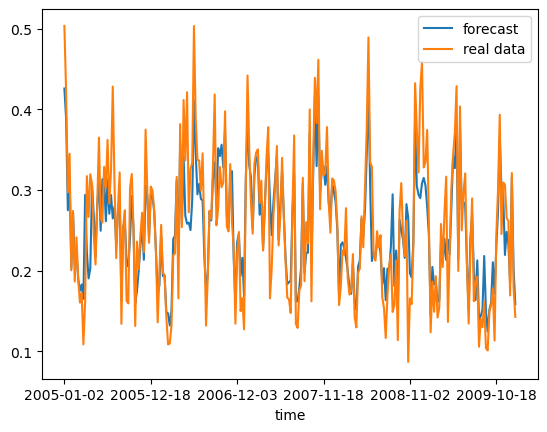

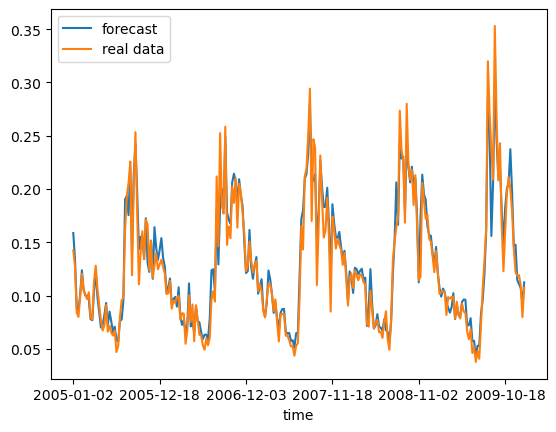

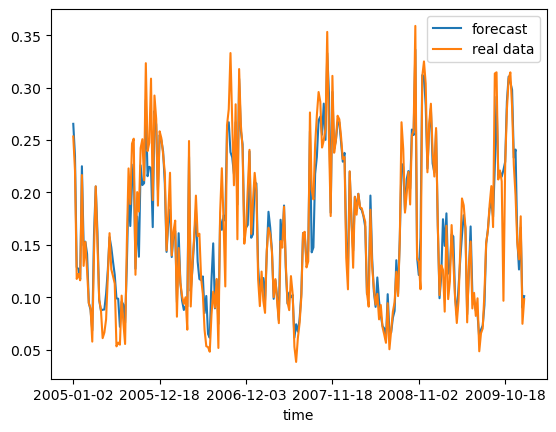

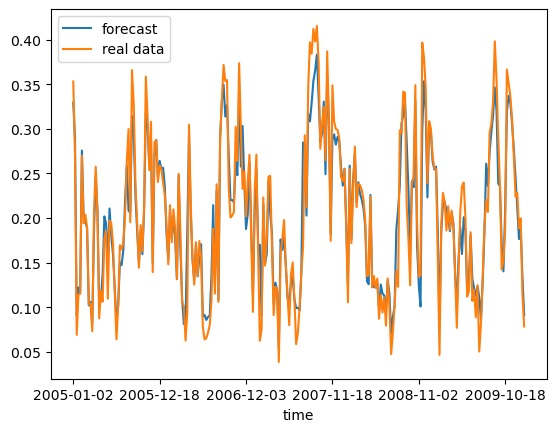

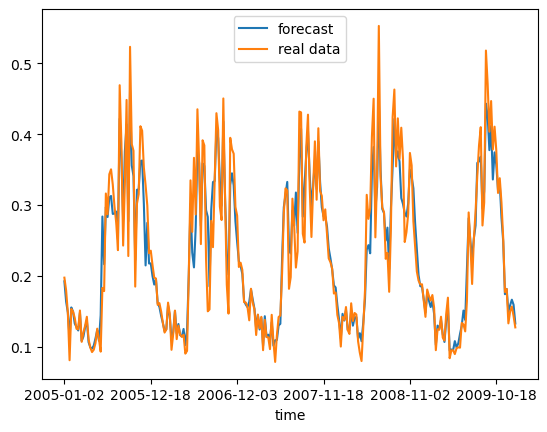

...

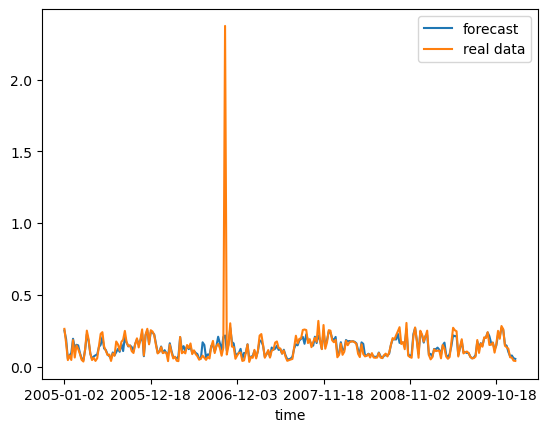

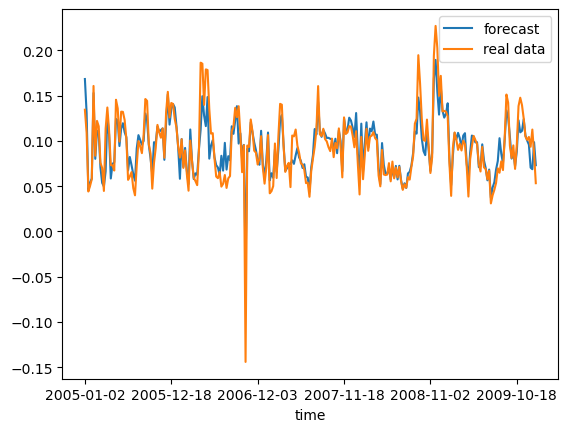

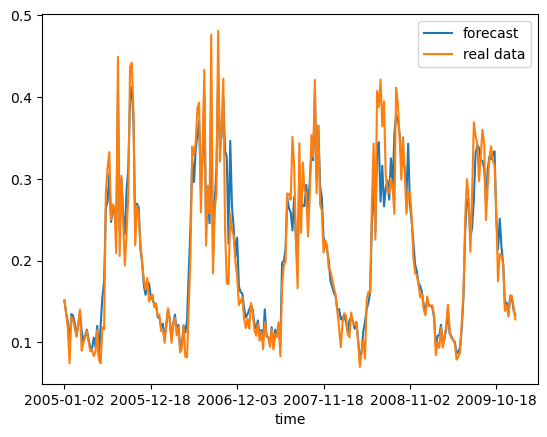

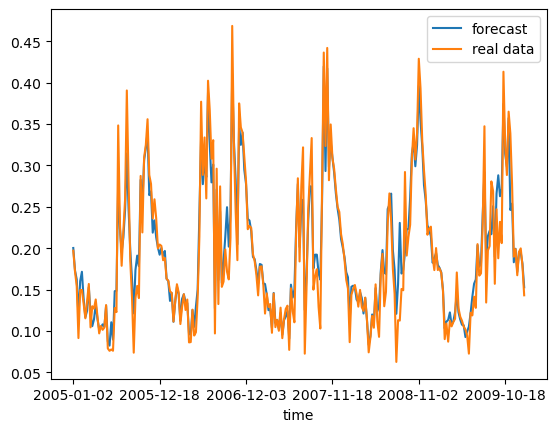

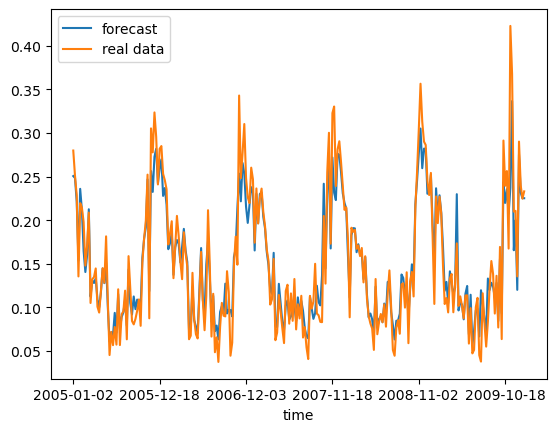

KeyboardInterrupt: 

In [117]:
coords = list(X[['lat','lon']].value_counts().keys())

for coord in coords:
    temp_X = X.loc[(X.lat==coord[0]) & (X.lon==coord[1])]
    temp_y = y['ndvi'][temp_X.index]
    temp_X.index = df['time'][temp_X.index]
    temp_y.index = temp_X.index 
    y_pred = rf.predict(temp_X)
    temp_pred = pd.Series(y_pred)
    temp_pred.index = temp_X.index 
    
    pd.Series(temp_pred).plot(label='forecast')
    pd.Series(temp_y).plot(label='real data')
    plt.legend()
    plt.show()

In [26]:
y_test.iloc[2]

ndvi    0.396771
Name: 1035, dtype: float64

In [67]:
# Tree on XGBoost
explainerXGB = shap.TreeExplainer(xgb_model)
shap_values_XGB_test = explainerXGB.shap_values(X_test)
shap_values_XGB_train = explainerXGB.shap_values(X_train)
# Tree on Scikit GBT
explainerSKGBT = shap.TreeExplainer(sk_xgb)
shap_values_SKGBT_test = explainerSKGBT.shap_values(X_test)
shap_values_SKGBT_train = explainerSKGBT.shap_values(X_train)

# Tree on Random Forest explainer
explainerRF = shap.TreeExplainer(rf)
shap_values_RF_test = explainerRF.shap_values(X_test)
shap_values_RF_train = explainerRF.shap_values(X_train)

In [ ]:
# XGBoost
df_shap_XGB_test = pd.DataFrame(shap_values_XGB_test, columns=X_test.columns.values)
df_shap_XGB_train = pd.DataFrame(shap_values_XGB_train, columns=X_train.columns.values)
# Scikit GBT
df_shap_SKGBT_test = pd.DataFrame(shap_values_SKGBT_test, columns=X_test.columns.values)
df_shap_SKGBT_train = pd.DataFrame(shap_values_SKGBT_train, columns=X_train.columns.values)
# Random Forest
df_shap_RF_test = pd.DataFrame(shap_values_RF_test, columns=X_test.columns.values)
df_shap_RF_train = pd.DataFrame(shap_values_RF_train, columns=X_train.columns.values)

In [ ]:
# LIME has one explainer for all models
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
    feature_names=X_train.columns.values.tolist(),
    class_names=['ndvi'],
    verbose=True, mode='regression')

In [ ]:
j = 0
# initialize js for SHAP
shap.initjs()